# Clusteranalysis
## Imports

In [26]:
from __future__ import division

import ast

import pandas as pd
import numpy as np
from gensim.models import KeyedVectors
from sklearn.cluster import KMeans
from functions import (build_word_vector_matrix,
                       silhouette_analysis)

import matplotlib.pyplot as plt

### Load suggestion terms

In [27]:
with open('./suggestion_terms_NN_1.txt', 'r', encoding='utf-8') as f:
    suggestions = [term[:-1] for term in f.readlines()]
print(suggestions[:20])

['transaktionsanalyse', 'wissenschaftsministerium', 'ehrenerklärung', 'zentralabitur', 'jugendreferent', 'elektronik', 'kaufoption', 'trainerschein', 'physiotherapie', 'herzfehler', 'berufung', 'heimertingen', 'krach', 'kobalt', 'liebeskummer', 'trauung', 'haushaltshilfe', 'privatleben', 'windsurfen', 'pressesprecher']


## Cluster Analysis

### Load GloVe Embeddings and get vectors for suggestion terms

In [4]:
glove_model = KeyedVectors.load_word2vec_format("../dis25-2021/glove.6B.100d.w2vformat.txt6",binary=False)

In [28]:
suggestions = [term for term in suggestions if term in glove_model.index_to_key]
suggestion_terms_vectors = [glove_model.get_vector(term) for term in suggestions]



### Perform Silhouette Analysis to find the optimal number of clusters

For n_clusters = 2 The average silhouette_score is : 0.18150893
For n_clusters = 3 The average silhouette_score is : 0.087135814
For n_clusters = 4 The average silhouette_score is : 0.08302312
For n_clusters = 5 The average silhouette_score is : 0.033985186
For n_clusters = 6 The average silhouette_score is : 0.037139256
For n_clusters = 7 The average silhouette_score is : 0.04052282
For n_clusters = 8 The average silhouette_score is : 0.052825697
For n_clusters = 9 The average silhouette_score is : 0.041627128
For n_clusters = 10 The average silhouette_score is : 0.0017373648
For n_clusters = 11 The average silhouette_score is : 0.0013737249
For n_clusters = 12 The average silhouette_score is : 0.0036375024
For n_clusters = 13 The average silhouette_score is : -0.0010795116
For n_clusters = 14 The average silhouette_score is : 0.041855764
For n_clusters = 15 The average silhouette_score is : 0.002465798
For n_clusters = 16 The average silhouette_score is : -0.012347147
For n_clusters 

C:\Users\Pia\Documents\dis25\functions.py:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax1, ax2) = plt.subplots(1, 2)


For n_clusters = 22 The average silhouette_score is : -0.0133578945
For n_clusters = 23 The average silhouette_score is : -0.008863825
For n_clusters = 24 The average silhouette_score is : 0.027586773
For n_clusters = 25 The average silhouette_score is : -0.0040538334
For n_clusters = 26 The average silhouette_score is : -0.0026778337
For n_clusters = 27 The average silhouette_score is : 0.001999766
For n_clusters = 28 The average silhouette_score is : -0.008736153
For n_clusters = 29 The average silhouette_score is : 0.0037247033
For n_clusters = 30 The average silhouette_score is : -0.0053530145
For n_clusters = 31 The average silhouette_score is : -0.011875741
For n_clusters = 32 The average silhouette_score is : 0.00030601976
For n_clusters = 33 The average silhouette_score is : 0.0015717134
For n_clusters = 34 The average silhouette_score is : -0.006315121
For n_clusters = 35 The average silhouette_score is : -0.011505452
For n_clusters = 36 The average silhouette_score is : -0.00

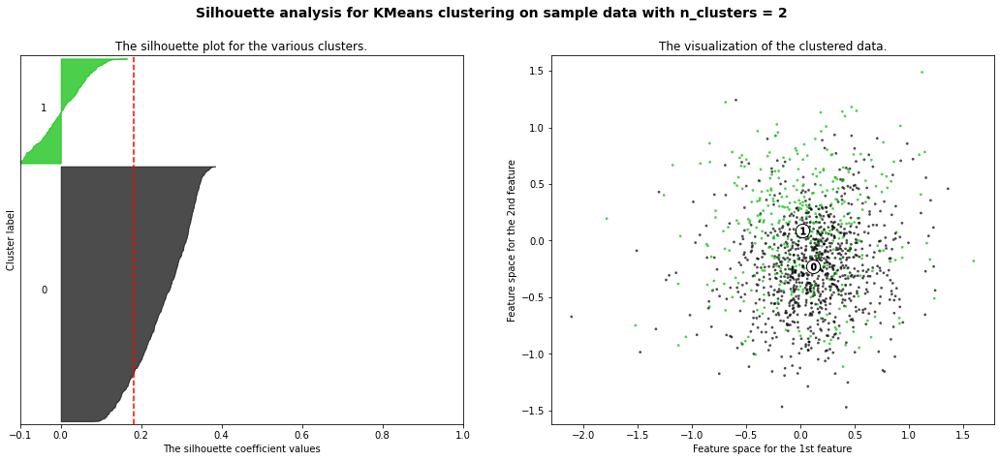

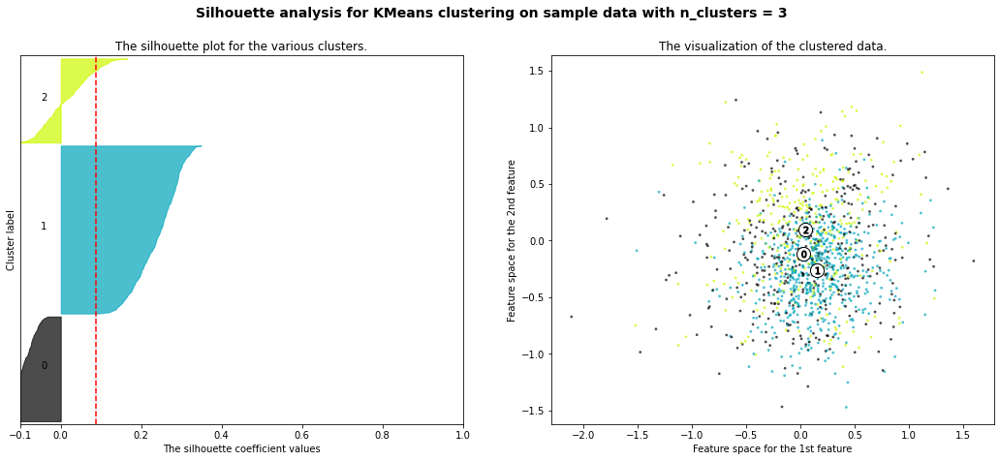

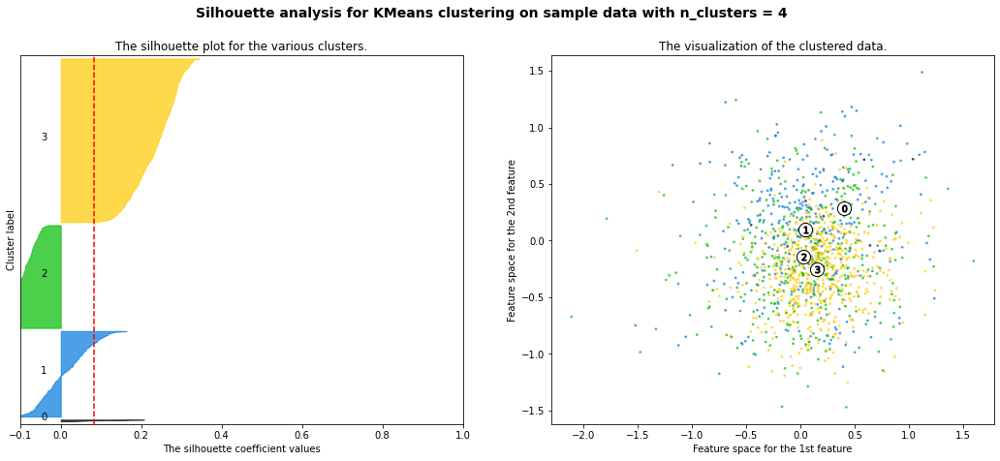

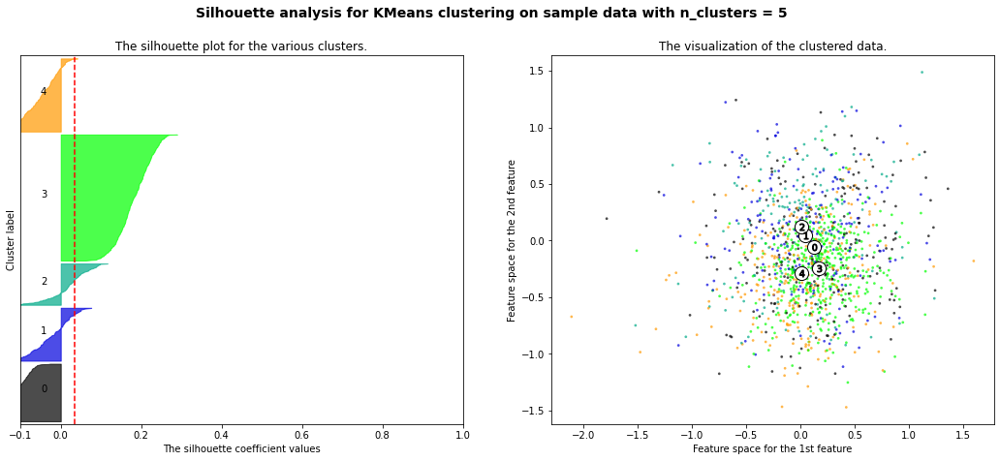

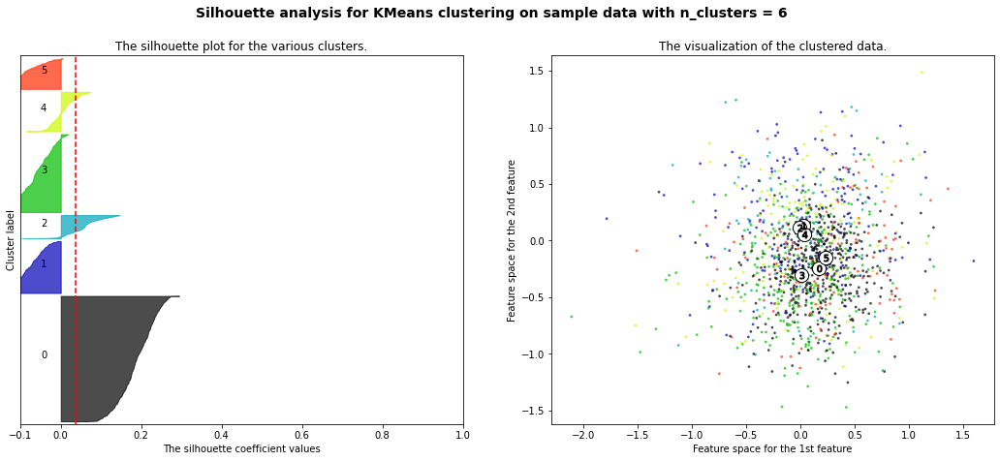

...

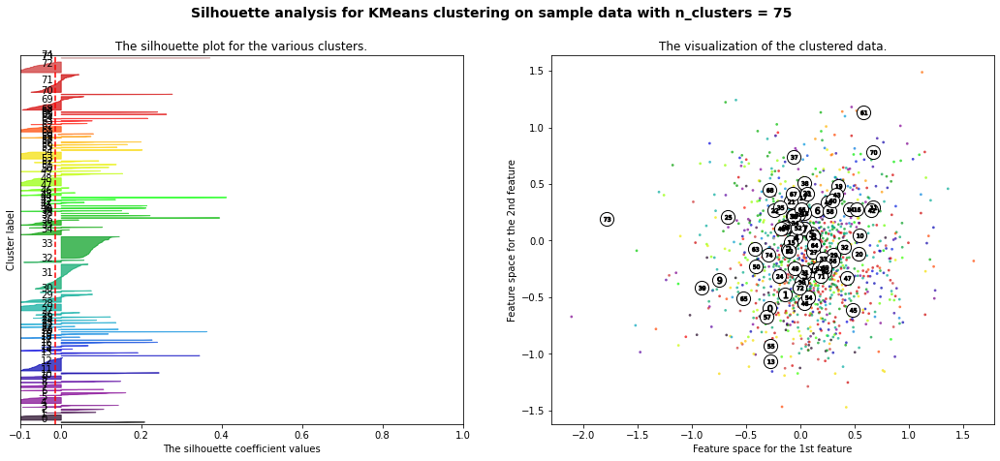

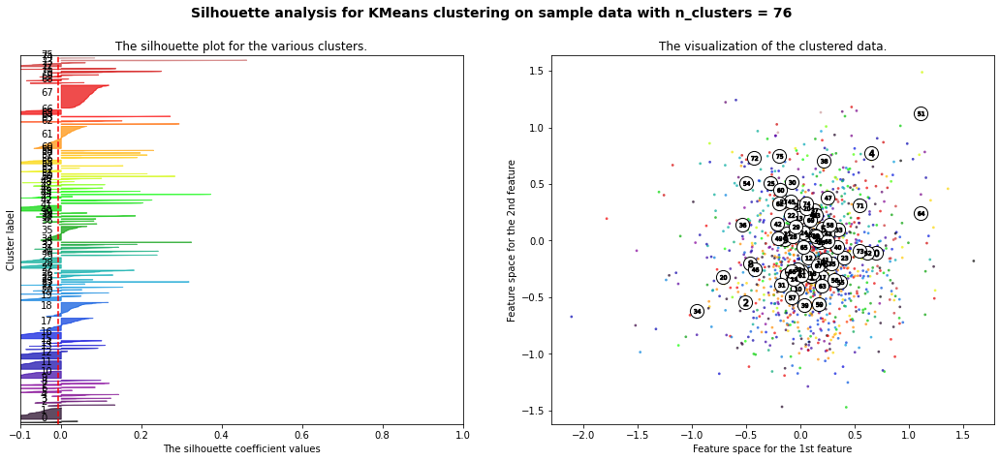

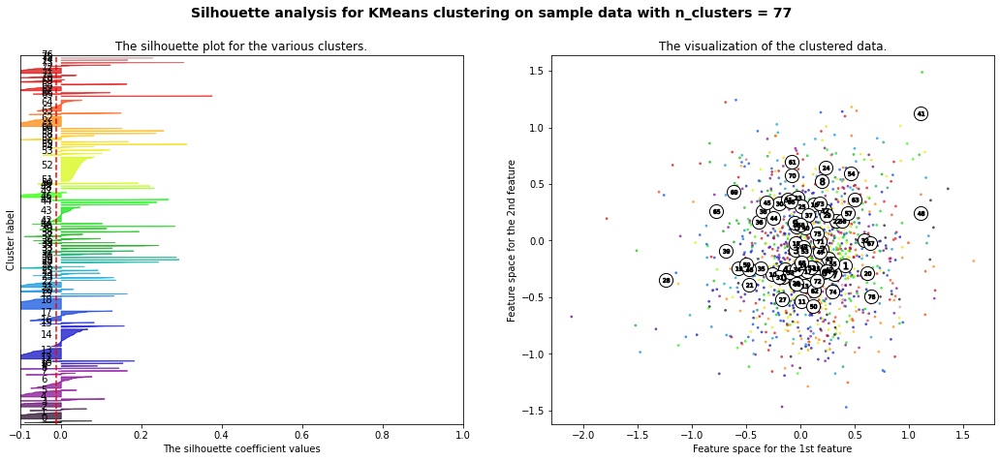

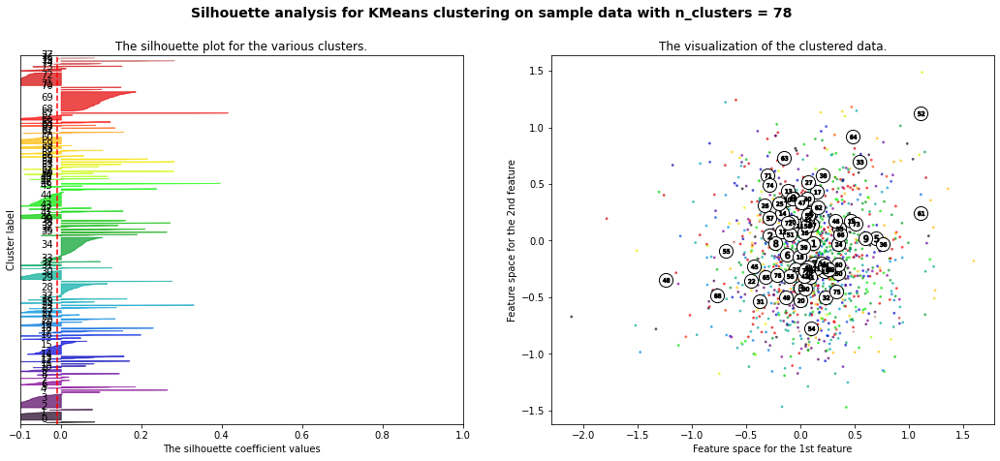

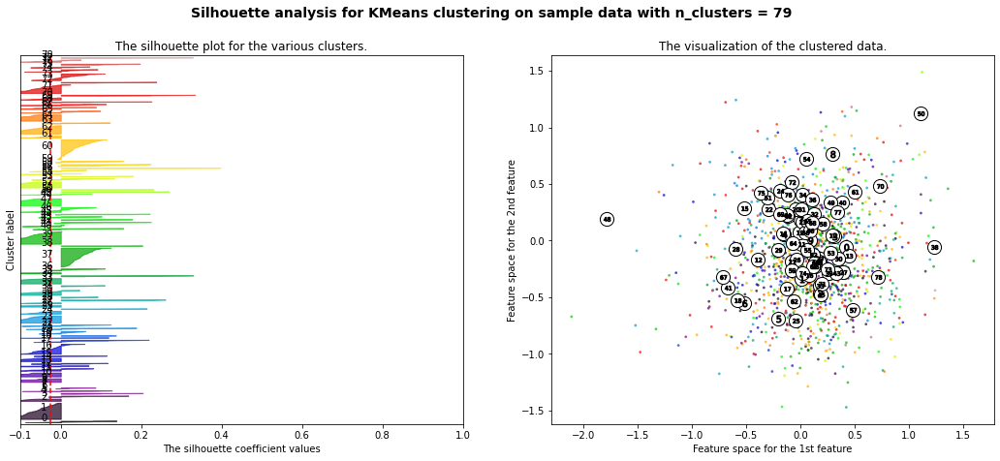

In [29]:
silhouette_analysis(np.array(suggestion_terms_vectors),2,80)

### Perform K-Means Clustering with the optimal number of clusters determined by the Silhouette Analysis

In [31]:
input_vector = np.array(suggestion_terms_vectors) # Vector file input (e.g. glove.6B.300d.txt)
input_label = suggestions
df, labels_array = build_word_vector_matrix(input_vector, input_label, len(input_label))

In [32]:
kmeans_model = KMeans(init='k-means++', n_clusters=32, n_init=1,max_iter=200)
kmeans_model.fit(df)
labels = kmeans_model.labels_
suggestion_clusters_df=pd.DataFrame(list(zip(suggestions,suggestion_terms_vectors, labels)),columns=['title', 'vector', 'cluster'])

### Show Clusters and corresponding terms

In [33]:
for i in sorted(suggestion_clusters_df.cluster.unique()):
    print('Cluster ',i,': ',suggestion_clusters_df[suggestion_clusters_df.cluster == i].title.to_list())



Cluster  0 :  ['habilitation', 'dissertation', 'fachhochschule', 'abitur', 'examen', 'semester']
Cluster  1 :  ['blaustein', 'dorf', 'braunstein', 'helfer', 'weinberger', 'volk', 'søren', 'licht', 'honig', 'steinbrecher', 'reis', 'heim', 'wale', 'bruder', 'acker', 'kreis', 'fisch', 'schacht', 'unicredit', 'frieden', 'zettel', 'leder', 'unterberger', 'gast', 'sprecher', 'kamin', 'kader', 'bier', 'becher', 'kluft', 'dorn', 'landau', 'neugebauer', 'streit', 'bosse', 'kropf', 'freund', 'steinmetz', 'asta', 'kranz', 'eisenmann', 'rabe', 'schild', 'steinhauer', 'laub', 'welker', 'wasser', 'zwilling', 'trost', 'jacke', 'grube', 'zweig', 'fels', 'tabak', 'schwimmer', 'birnbaum', 'greis', 'christiansen', 'messer', 'klima', 'hirschfeld', 'schein', 'rausch', 'insel', 'garten', 'ritter', 'funke', 'zoll', 'anker', 'saal', 'stampfer', 'primark', 'wohlfahrt']
Cluster  2 :  ['uhr', 'lohn', 'bahn', 'wahl', 'witz', 'stil', 'ding', 'maz', 'furt', 'sohn', 'reh', 'ohr', 'zahn', 'din', 'werk']
Cluster  3 : 

In [ ]:
### Save k-means cluster dataframe

In [115]:
suggestion_clusters_df.to_csv('./kmeans_clustering.csv')

## Plot Clusters

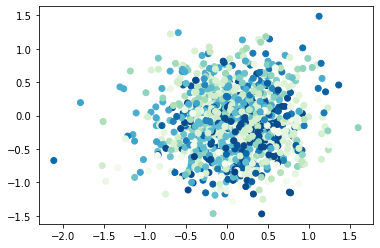

<Figure size 432x288 with 0 Axes>

In [130]:
suggestions_vectors = np.array([np.array([float(x) for x in vector]) for vector in suggestion_clusters_df.vector.to_list()])

#centers
c = [n for n in range(1,61)]
plt.scatter(suggestions_vectors[:,0],suggestions_vectors[:,1], c=suggestion_clusters_df.cluster.to_list(),cmap='GnBu')
plt.show()
plt.savefig('./kmeans_clusters.png')

## Reorder and optimize clusters manually and add labels

In [93]:
cluster_df = pd.DataFrame(columns=['cluster_label','cluster_terms'])

In [94]:
cluster_df.at[0,'cluster_label'] = 'geografisch'
cluster_df.at[0,'cluster_terms'] =['wiedenbrück', 'mayrhofen', 'hohenschönhausen', 'wümme', 'eimsbüttel', 'dorotheum',
                                   'moabit', 'salzuflen', 'süd', 'eichsfeld', 'echterdingen', 'alsenz', 'nordstrand',
                                   'küsnacht', 'marzahn', 'stalingrad', 'prenzlauer', 'brandenburger', 'folkwang',
                                   'volkskammer', 'berchtesgaden', 'uckermark', 'brocken', 'nürburgring', 'saalekreis',
                                    'stadelhofen', 'oderbruch', 'osterholz', 'lechfeld', 'thomanerchor', 'kremsmünster',
                                    'feuerbach', 'schwaben', 'königssee', 'ostholstein', 'vogelsberg', 'brauweiler',
                                    'landquart', 'hafencity', 'tilsit', 'amrum', 'zugspitze', 'steiermark', 'burgenlandkreis',
                                    'beuthen', 'osterode', 'altmark', 'hohenzollern', 'gendarmenmarkt', 'blankenese',
                                    'küssnacht', 'wattenscheid', 'altmarkkreis', 'bürgenstock', 'schwenningen', 'kyffhäuser',
                                   'pommern', 'hoppegarten', 'kranzberg', 'schönfeld', 'blaustein', 'neuenstadt', 'hindelang',
                                    'buchheim', 'westendorf', 'fallersleben', 'blankenstein', 'hoffenheim', 'lauffen',
                                    'berghof', 'westpark', 'ostfriesland', 'lindenhof', 'stalingrad']



In [95]:
cluster_df.at[1,'cluster_label'] = 'unternehmen_marken'
cluster_df.at[1,'cluster_terms']= ['bauhaus','prosieben','sparkasse','vorwerk','meininger','jägermeister', 'liebeskind','malteser',
                                   'meiler','evonik','spielvogel','raiffeisenbank','blaupunkt','gmbh', 'airbus','telekom', 
                                   'vattenfall', 'volkswagen','hypovereinsbank', 'postbank','benz','pfizer', 'raiffeisen',
                                   'commerzbank','allianz', 'sulzer','fresenius','volksbank', 'sennheiser','primark','firma',
                                   'tupperware','esprit','birkenstock','voigt','schwarzkopf','deichmann','ratiopharm']


In [96]:
cluster_df.at[2,'cluster_label'] = 'sport_hobbies'
cluster_df.at[2,'cluster_terms']= ['angeln', 'poker', 'liga', 'club', 'coach', 'knockout', 'team', 'regionalliga',
                                   'training', 'landsmannschaft', 'fußball', 'duell', 'shooter', 'floorball', 'basketball',
                                    'bodybuilding', 'handballer', 'bodybuilder', 'referee', 'softball', 'golfer', 'footballer',
                                    'volleyball', 'tennis', 'boxer', 'handball', 'bundesliga', 'eintracht', 'sport',
                                    'baseball', 'box', 'fighter', 'sponsor', 'spiel', 'stürmer', 'stadion', 'olympiastadion',
                                    'turnier', 'paintball', 'hobby', 'schwimmer', 'motorsport']

In [97]:
cluster_df.at[3,'cluster_label'] = 'nachrichten_zeitung'
cluster_df.at[3,'cluster_terms']= ['kicker', 'stuttgarter', 'verlag', 'welle', 'rundschau', 'presse', 'zeitung', 'zeitschrift',
                                    'bild', 'wirtschaftswoche', 'rundfunk', 'welt', 'spiegel', 'weltwoche', 'tagblatt',
                                    'abendblatt', 'maz','stern']

In [98]:
cluster_df.at[4,'cluster_label'] = 'militaer_polizei'
cluster_df.at[4,'cluster_terms']= ['oberstleutnant', 'oberleutnant', 'panzer', 'luftwaffe', 'kapitänleutnant', 'sturmbannführer',
                                    'obersturmbannführer', 'generalmajor', 'oberst', 'admiral', 'gewehr', 'kompanie',
                                    'einheit', 'sturmgewehr', 'flotte', 'tatort', 'armee', 'wache', 'widerstand',
                                    'kaliber', 'uniform', 'polizei', 'kommissar', 'soldat', 'commander', 'lka',
                                   'kavallerie', 'razzia']

In [99]:
cluster_df.at[5,'cluster_label'] = 'technologie_medien'
cluster_df.at[5,'cluster_terms']= ['information', 'laptop', 'browser', 'javascript', 'internet', 'twitter', 'newsletter',
                                    'homepage', 'ticketmaster', 'computer', 'youtube', 'website', 'software', 'mobilfunk',
                                    'elektronik', 'antenne', 'informatik', 'iot', 'grafik', 'programm', 'pinterest',
                                    'minecraft', 'github', 'rechner', 'tinder', 'handy', 'gigabyte', 'reboot', 'freenet',
                                    'soap', 'code', 'reddit', 'telefon', 'elektro','technologie','fernsehen']

In [100]:
cluster_df.at[6,'cluster_label'] = 'kunst_kultur'
cluster_df.at[6,'cluster_terms']= ['radio', 'broadcast', 'songs', 'cds', 'release', 'film', 'show', 'audio', 'video',
                                    'label', 'dvd', 'videos', 'demo', 'musical', 'single', 'animation', 'version',
                                    'movie', 'playlist', 'comic', 'studio', 'bonus', 'plus', 'album', 'clip', 'percussion',
                                    'drummer', 'trio', 'rap', 'songwriter', 'artist', 'tenor', 'bassist', 'duo', 'organ',
                                    'pianist', 'organist', 'rapper', 'instrument', 'collage', 'volksoper', 'volksbühne',
                                    'staatstheater', 'kabarett', 'stadthalle', 'filmproduktion', 'schauspielhaus',
                                   'kunsthalle', 'kunst', 'philharmonie', 'akademie', 'oper', 'orchester', 'staatsoper',
                                   'musik', 'galerie', 'musiker', 'orgel', 'maler', 'kunst', 'disco', 'theater',
                                    'atelier', 'papier', 'foto', 'dramaturg', 'ticket', 'poster', 'slogan', 'event',
                                    'logo', 'sommelier', 'boogie', 'literatur', 'bild', 'kultur', 'künstler', 'statue',
                                    'eurovision', 'design', 'gesang', 'kamera', 'illustrator', 'writer', 'kino', 'buch',
                                   'ballett', 'oktoberfest', 'comeback', 'journalist', 'gedicht', 'bibliothek', 'keramik',
                                    'staatsbibliothek', 'schlager', 'klavier', 'popstar', 'lied', 'museum', 'regie',
                                    'autor', 'tournee', 'ruhm', 'bühne','illustration']
                                   
                                   

In [101]:
cluster_df.at[7,'cluster_label'] = 'bildung'
cluster_df.at[7,'cluster_terms']= ['schüler', 'gesamtschule', 'realschule', 'oberschule', 'student', 'kindergarten',
                                   'abitur', 'hochschule', 'institut', 'schule', 'semester', 'gymnasium', 'seminar',
                                    'kurs', 'bildung', 'fach', 'studium', 'dissertation', 'tafel', 'universität',
                                    'grundschule', 'fachhochschule', 'auditorium', 'lehrer','habilitation', 'examen','asta']

In [102]:
cluster_df.at[8,'cluster_label'] = 'wissenschaft_forschung'
cluster_df.at[8,'cluster_terms'] = ['fraunhofer', 'biologie', 'chemie', 'forschung', 'förderung', 'professor',
                                    'psychologist', 'philosophie', 'mathematik', 'evolution', 'labor', 'wissenschaft',
                                     'physik', 'symposium', 'studie']

In [103]:
cluster_df.at[9,'cluster_label'] = 'mode_aussehen'
cluster_df.at[9,'cluster_terms'] = ['jacke', 'schuh', 'pumps', 'outfit', 'trend', 'mode', 'stylist', 'overall',
                                    'designer', 'hairstylist', 'ring', 'pullover', 'sneaker', 'hoodie', 'psychologie',
                                     'armband', 'hut']

In [104]:
cluster_df.at[10,'cluster_label'] = 'privatleben'
cluster_df.at[10,'cluster_terms'] = ['ehe', 'schwester', 'bruder', 'sohn', 'frau', 'gender', 'vater', 'mutter', 'kind',
                                      'revolution', 'adoption', 'familie', 'studentenverbindung', 'liebe', 'erbe',
                                      'mann', 'zwilling',  'burschenschaft', 'onkel']

In [105]:
cluster_df.at[11,'cluster_label'] = 'transport'
cluster_df.at[11,'cluster_terms'] = ['taxi', 'trailer', 'route', 'shuttle', 'depot', 'pilot', 'truck', 'limousine',
                                      'caravan', 'garage', 'yacht', 'bike', 'airport', 'chauffeur', 'scooter', 'bus',
                                      'tunnel', 'autobahn', 'traktor', 'straßenbahn', 'motorrad', 'copilot', 'import',
                                      'tour', 'transport', 'flughafen', 'bahnhof', 'helikopter', 'straße', 'verkehr',
                                      'strecke', 'schiff', 'trabant', 'oldtimer', 'lokomotive', 'eisenbahn', 'kanu',
                                      'speedster', 'bahn', 'airline', 'tanker', 'auto', 'kapitän']

In [106]:
cluster_df.at[12,'cluster_label'] = 'politik'
cluster_df.at[12,'cluster_terms'] = ['reichstag', 'landkreis', 'rathaus', 'oberbürgermeister', 'bürgermeister', 'mittelstand',
                                      'reichsbanner', 'bundesamt', 'bundesministerium', 'präsident', 'staatsrat', 'fahne',
                                      'verfassungsschutz', 'abgeordnetenhaus', 'gemeinderat', 'grundgesetz', 'amtsgericht',
                                      'bundesland', 'wahlkreis', 'ministerpräsident', 'arbeiterpartei', 'bundesrepublik',
                                      'parlament', 'kommission', 'machtergreifung', 'senat', 'landrat', 'liberale',
                                      'bundesverband', 'bürgerschaft', 'bewegung', 'kanzler', 'wahl', 'stimme', 'republikaner',
                                      'bündnis', 'bund', 'stadt', 'lobbyist', 'diplomat', 'reform', 'opposition', 'demonstration',
                                      'lobby', 'nation', 'partei', 'politik', 'nationalrat', 'volk', 'ngo', 'putsch']

In [107]:
cluster_df.at[13,'cluster_label'] = 'wirtschaft'
cluster_df.at[13,'cluster_terms']= ['bank', 'investor', 'partner', 'stock', 'banknote', 'börse', 'wirtschaft', 'euro',
                                    'geld', 'handel', 'markt', 'inflation', 'steuer', 'kredit']

In [108]:
cluster_df.at[14,'cluster_label'] = 'speisen'
cluster_df.at[14,'cluster_terms']= ['brasserie', 'torte', 'kaffee', 'humus', 'eis', 'bratwurst', 'currywurst', 'fleisch',
                                     'bio', 'steak', 'essig', 'gin', 'restaurant', 'biergarten', 'steakhouse', 'wein',
                                     'tomate', 'bier', 'lebkuchen', 'sauerkraut', 'latte', 'bartender', 'reis', 'honig',
                                     'weingut', 'banane', 'brei', 'brauerei', 'milch']

In [109]:
cluster_df.at[15,'cluster_label'] = 'gesundheit_koerper'
cluster_df.at[15,'cluster_terms'] = ['ellenbogen', 'droge', 'reflex', 'brust', 'maske', 'raucher', 'grippe', 'bein',
                                     'praxis', 'krankenhaus', 'diagnose', 'psychiatrie', 'mund', 'doktor', 'blut',
                                      'dentist', 'internist', 'operation', 'fuß', 'haut', 'apotheker', 'gesundheit',
                                     'chirurgie', 'medizin', 'auge', 'tourette', 'kopf', 'klinik', 'reha', 'herz',
                                      'bauch', 'ohr', 'alzheimer', 'brille', 'arzt', 'skin', 'pharma', 'defibrillator']

In [110]:
cluster_df.at[16,'cluster_label'] = 'recht'
cluster_df.at[16,'cluster_terms'] = ['gericht', 'gesetz', 'mandat', 'jura', 'recht', 'staatsexamen', 'strafe', 'jurist',
                                      'notar', 'landgericht', 'patent', 'olg']

In [111]:
cluster_df.at[17,'cluster_label'] = 'terror'
cluster_df.at[17,'cluster_terms'] = ['explosion', 'terror','zerstörer', 'bombe', 'terrorist', 'gewalt', 'opfer','attentat']

In [112]:
cluster_df.at[18,'cluster_label'] = 'religion_glauben'
cluster_df.at[18,'cluster_terms'] = ['reformist', 'kirche', 'kloster', 'islamist', 'moslem', 'muslim', 'evangelist',
                                      'theologie', 'pastor', 'priester', 'ritual', 'bischof', 'bibel', 'kreuz', 'gott',
                                      'religion']

In [113]:
cluster_df.at[19,'cluster_terms'] = [suggestion for suggestion in suggestion_clusters_df.title.to_list() if suggestion not in [term for cluster in cluster_df.cluster_terms.to_list() for term in cluster]]
cluster_df.at[19,'cluster_label'] = 'sonstige'

### Save manual clusters to file

In [131]:
cluster_df.to_csv('./manual_clustering.csv')